<a href="https://colab.research.google.com/github/arizonaCameraLab/computationalImaging/blob/master/Chapter3ImageEstimation/imageSubsampling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Image subsampling
###David Brady
### University of Arizona

Simple examples of image subsampling used in episode 14 of the Computational Optical Imaging video series

### Python modules

In [1]:
import numpy as np
from skimage import io
from skimage import color, data, restoration, exposure
from scipy.signal import convolve2d, convolve
from scipy.signal import bspline
import matplotlib.pyplot as plt
from google.colab import files
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams.update({'font.size': 22})

## Subsampling and image estimation

Here we apply the Wiener filter to restoration of 2D images. Consider the following original image.

In [2]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/snake.npy'

--2024-07-18 19:16:22--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/snake.npy
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/snake.npy [following]
--2024-07-18 19:16:23--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/snake.npy
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8.0M) [application/octet-stream]
Saving to: ‘snake.npy’

snake.npy           100%[===================>]   8.00M  47.9MB/s    in 0.2s    

2024-07-1

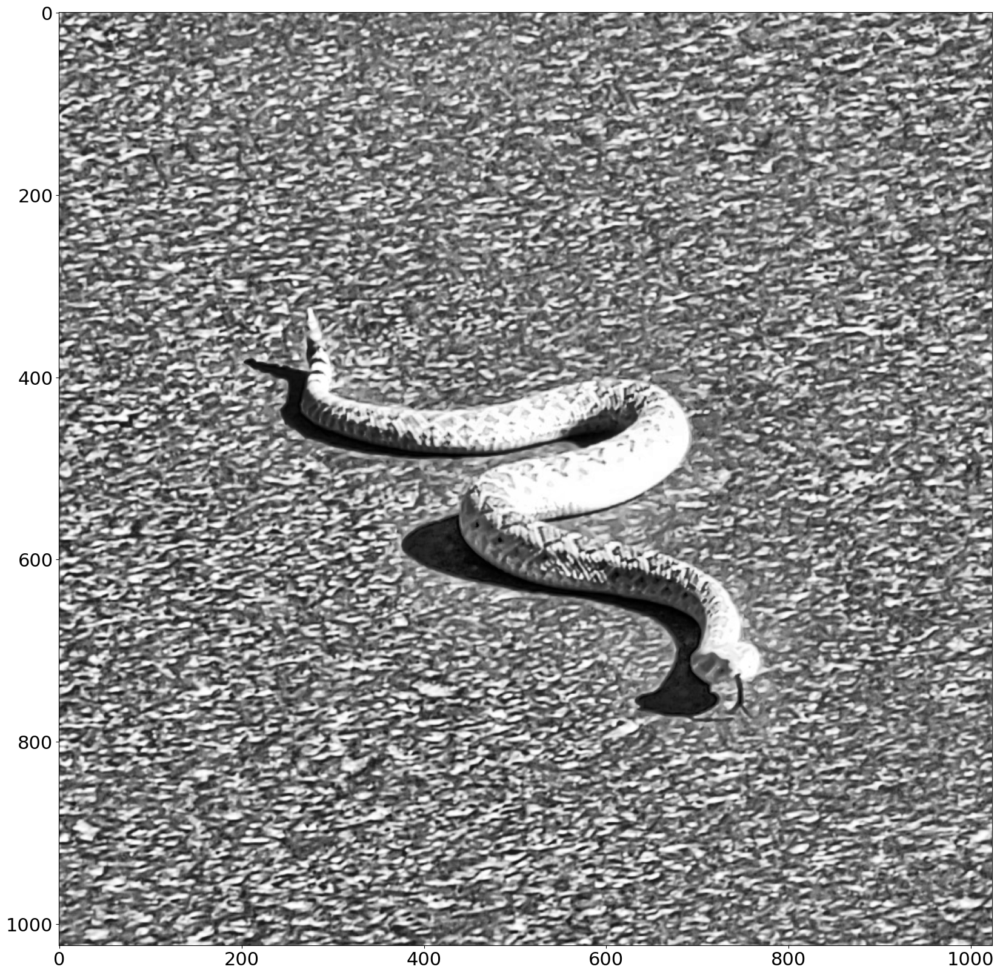

In [3]:
plt.figure(figsize=(20,20))
plt.gray()
snake=np.load('snake.npy')
snake=exposure.equalize_adapthist(snake)
plt.imshow(snake,cmap='gray')

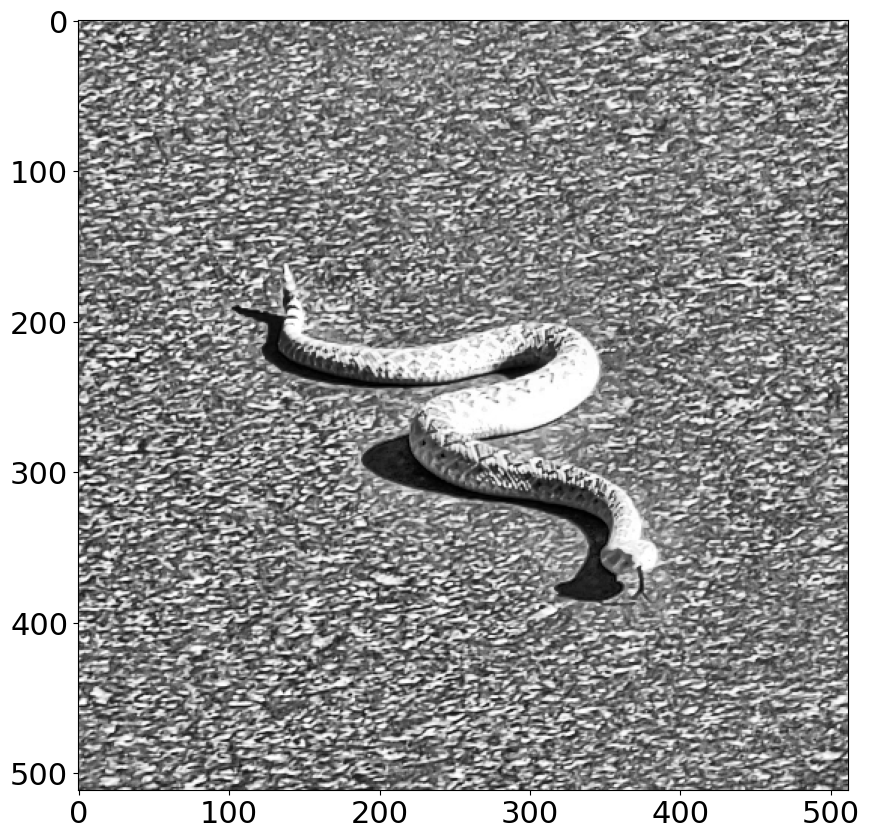

In [5]:

plt.imshow(snake[::2,::2],cmap='gray')

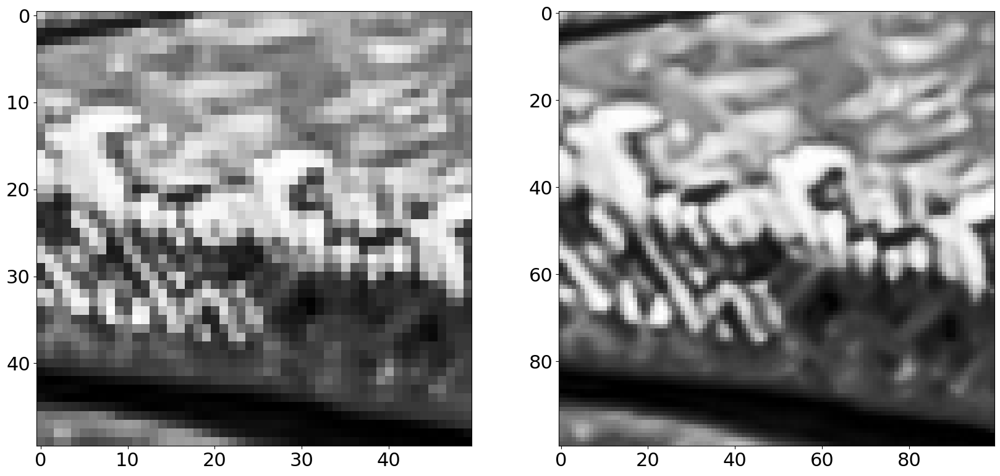

In [32]:
plt.subplot(121)
plt.imshow(snake[550:650:2,550:650:2],cmap='gray')
plt.subplot(122)
plt.imshow(snake[550:650,550:650],cmap='gray')

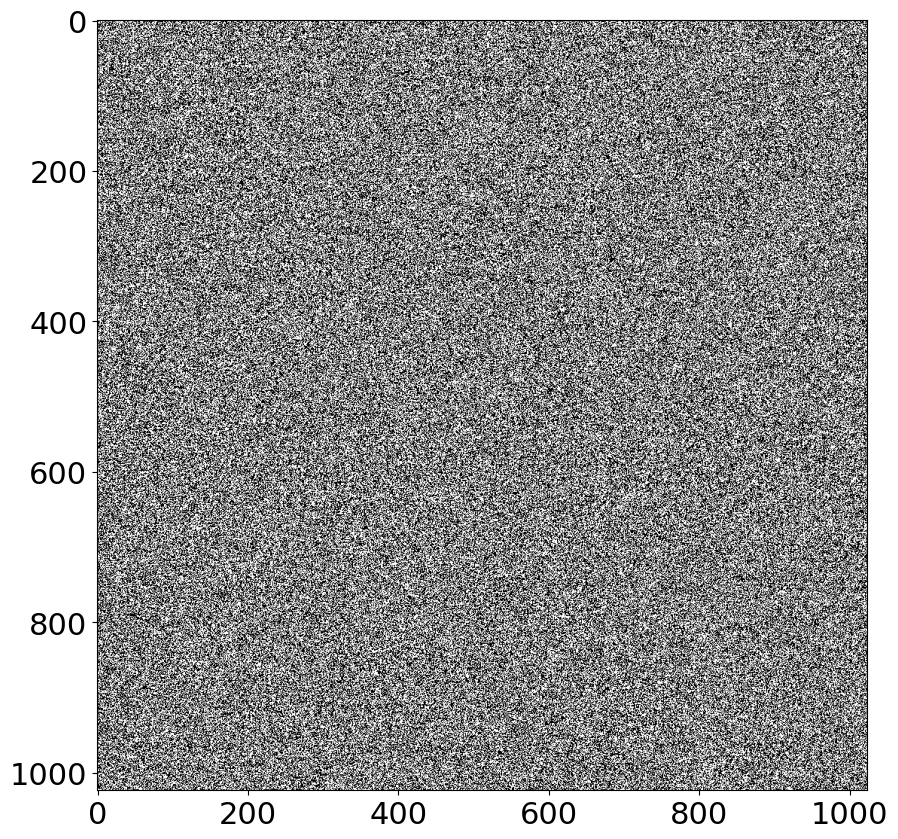

In [6]:
mask=np.random.random((1024,1024))
mask[mask<0.5]=0
mask[mask>=0.5]=1
plt.imshow(mask,cmap='gray')

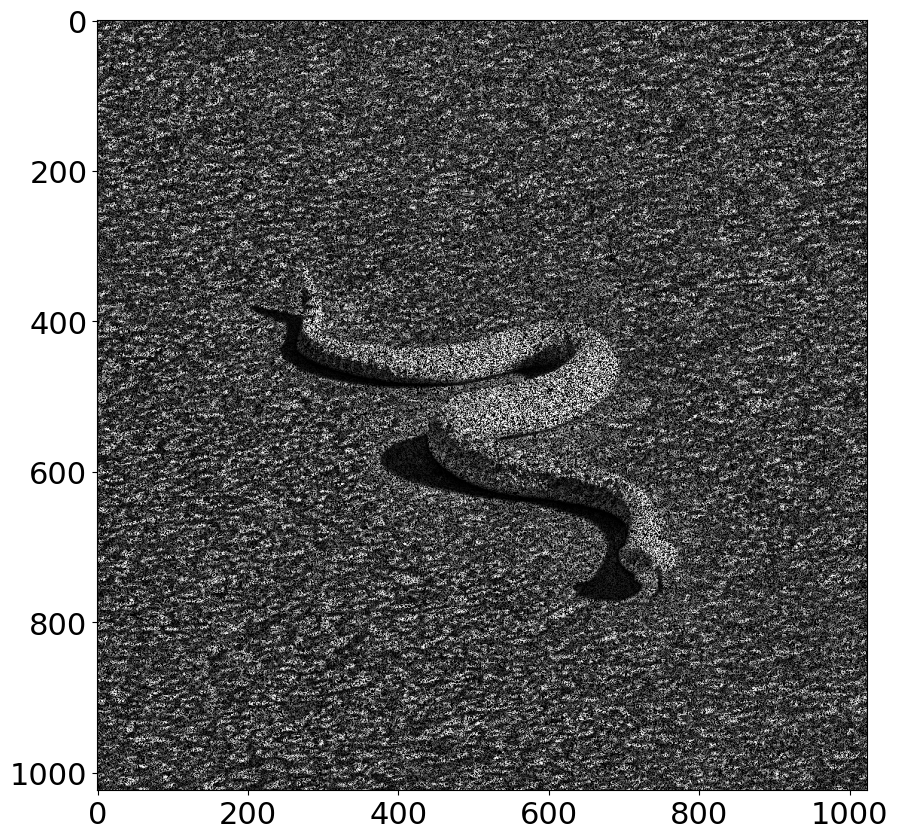

In [9]:
masked=snake*mask
plt.imshow(masked,cmap='gray')

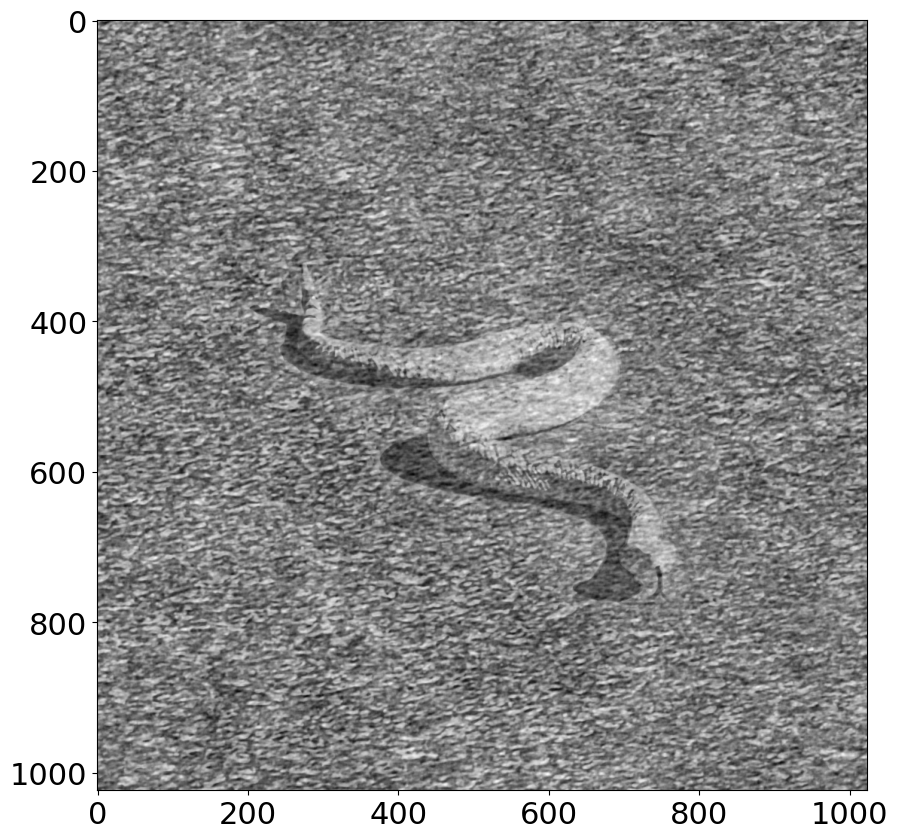

In [29]:
ftsnake=np.fft.fft2(snake)
ftsnake=ftsnake*mask
plt.imshow(np.fft.ifft2(ftsnake).real,cmap='gray')

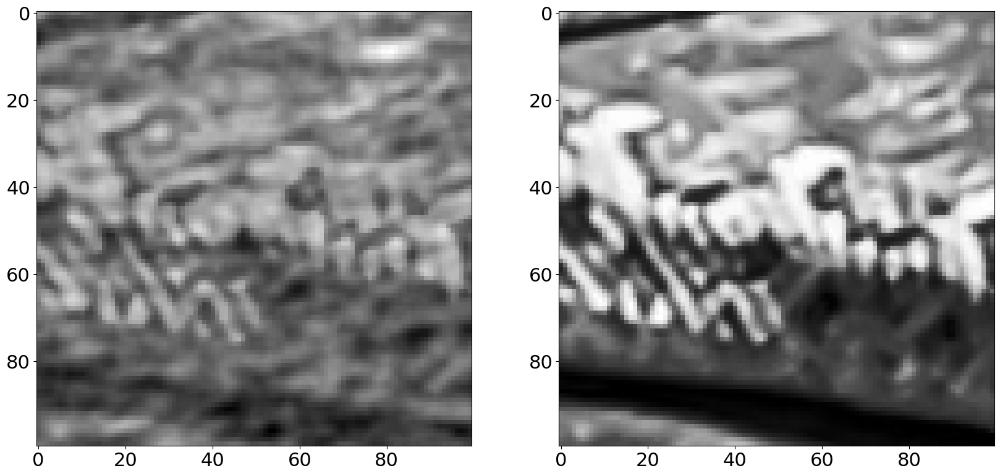

In [31]:
plt.subplot(121)
plt.imshow(np.fft.ifft2(ftsnake).real[550:650,550:650],cmap='gray')
plt.subplot(122)
plt.imshow(snake[550:650,550:650],cmap='gray')

Text(0.5, 1.0, 'Original')

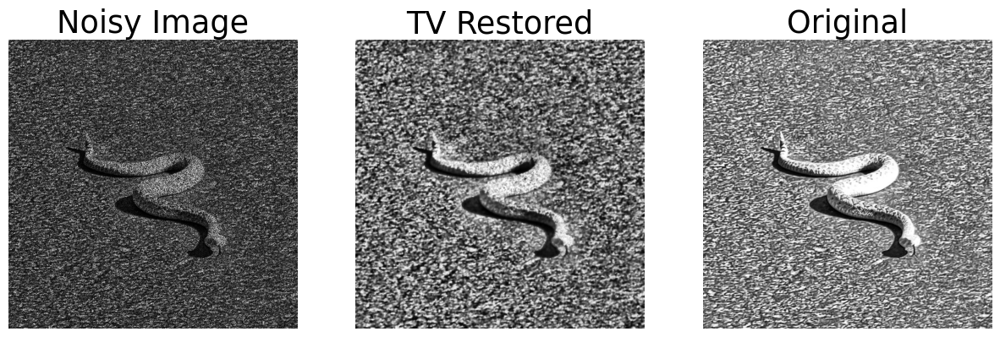

In [27]:
from skimage.restoration import denoise_tv_chambolle
from skimage import color, data, restoration, exposure, filters

denoised = denoise_tv_chambolle(masked, weight=.4)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(masked)
ax[0].axis('off')
ax[0].set_title('Noisy Image')
ax[1].imshow(exposure.equalize_adapthist(denoised))
ax[1].axis('off')
ax[1].set_title('TV Restored')
ax[2].imshow(snake)
ax[2].axis('off')
ax[2].set_title('Original')

Text(0.5, 1.0, 'Original')

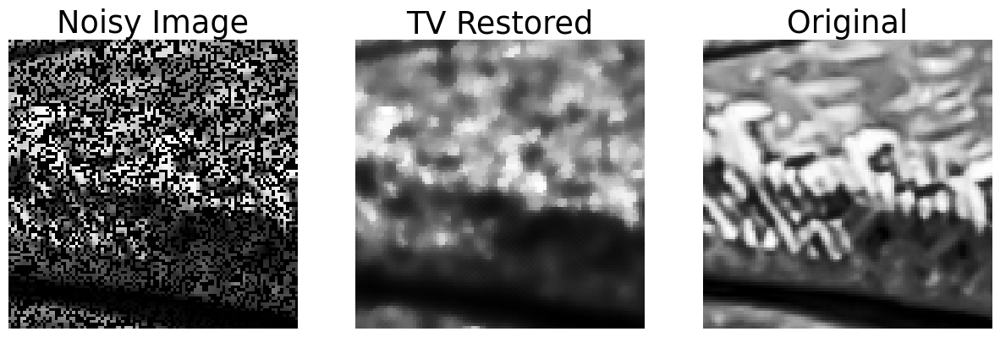

In [28]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(masked[550:650,550:650])
ax[0].axis('off')
ax[0].set_title('Noisy Image')
ax[1].imshow(exposure.equalize_adapthist(denoised)[550:650,550:650])
ax[1].axis('off')
ax[1].set_title('TV Restored')
ax[2].imshow(snake[550:650,550:650])
ax[2].axis('off')
ax[2].set_title('Original')